In [38]:
import xarray as xr
import numpy as np
import matplotlib.pylab as plt
import os
import time

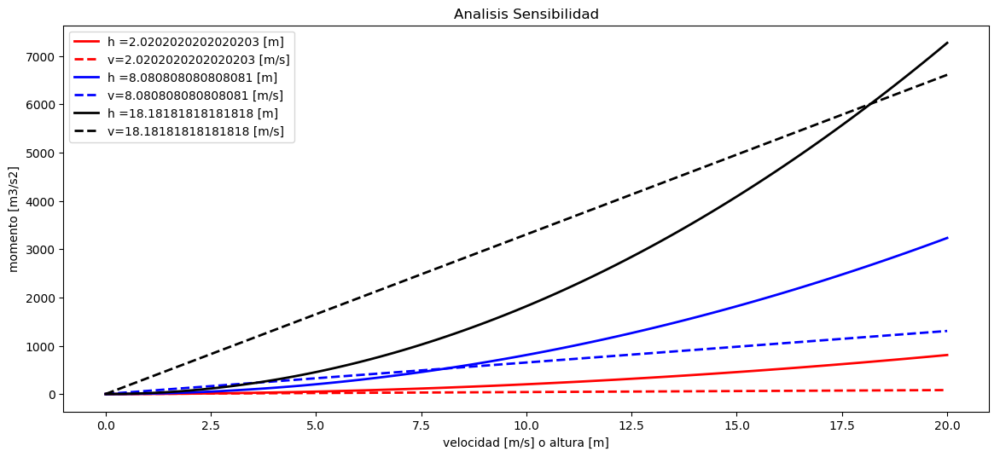

In [51]:
h=np.linspace(0,20,100)
v=np.linspace(0,20,100)

plt.figure(figsize=(14,6), dpi=100)
c=[10,40,90]
d=['red','blue','black','green','grey','magenta','darkorange','aqua','darkviolet','lime','brown']
e=0
for i in c:
    colorss=d[e]
    e=e+1
    mom_v1=h[i]*v*v
    mom_v2=h*v[i]*v[i]
    plt.plot(v,mom_v1 , color=colorss, linewidth=2,label='h ='+str(h[i])+' [m]')
    plt.plot(h,mom_v2, color=colorss,linewidth=2, label='v='+str(v[i])+' [m/s]',linestyle='dashed')
    plt.title('Analisis Sensibilidad')
    plt.xlabel('velocidad [m/s] o altura [m]')
    plt.ylabel('momento [m3/s2]')
    plt.legend(loc='upper left')

#plt.figure(figsize=(14,6), dpi=100)
#for i in c:
 #   mom_v2=h*v[i]*v[i]
  #  plt.plot(h,mom_v2 ,linewidth=2,label='v='+str(v[i])+' [m/s]')
   # plt.title('AS altura')
    #plt.xlabel('altura [m]')
    #plt.ylabel('momento [m3/s2]')
    #plt.legend(loc='upper left')


In [52]:
start_time = time.time()
ruta = os.getcwd()+'/'

runs  = [ruta+'Mw=9.2/E4_92_2/layer01_ts']#,ruta+'Mw=9.0/Escenario4/layer01_ts',ruta+'Mw=9.5/Escenario8/layer01_ts']
boyas = range(81)   # cantidad total de boyas
lim_boya_valpo = 43  # última boya de valpo
carpeta='Resultados_python/'
Escenario = 'Mw=9.2/E4_92_2/' #modificar según escenarios que compare
fold_eta='eta'
fold_ux='ux'
fold_uy='uy'
fold_mom_x='mom_x'
fold_mom_y='mom_y'
#fold_fza='fza'
#fold_fza_x='fza_x'
#fold_fza_y='fza_y'
if not os.path.exists(Escenario+carpeta+fold_eta): # crea folder si no existe
    os.makedirs(Escenario+carpeta+fold_eta)
if not os.path.exists(Escenario+carpeta+fold_ux): # crea folder si no existe
    os.makedirs(Escenario+carpeta+fold_ux)
if not os.path.exists(Escenario+carpeta+fold_uy): # crea folder si no existe
    os.makedirs(Escenario+carpeta+fold_uy)
if not os.path.exists(Escenario+carpeta+fold_mom_x): # crea folder si no existe
    os.makedirs(Escenario+carpeta+fold_mom_x)
if not os.path.exists(Escenario+carpeta+fold_mom_y): # crea folder si no existe
    os.makedirs(Escenario+carpeta+fold_mom_y)
    
#if not os.path.exists(carpeta+Escenario+fold_fza): # crea folder si no existe
 #   os.makedirs(carpeta+Escenario+fold_fza)
#if not os.path.exists(carpeta+Escenario+fold_fza_x): # crea folder si no existe
 #   os.makedirs(carpeta+Escenario+fold_fza_x)
#if not os.path.exists(carpeta+Escenario+fold_fza_y): # crea folder si no existe
 #   os.makedirs(carpeta+Escenario+fold_fza_y)
    
print("--- %s seconds ---" % (time.time() - start_time))
#print ruta

--- 0.00110507011414 seconds ---


/usr/lib/python2.7/dist-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


--- 196.116870165 seconds ---


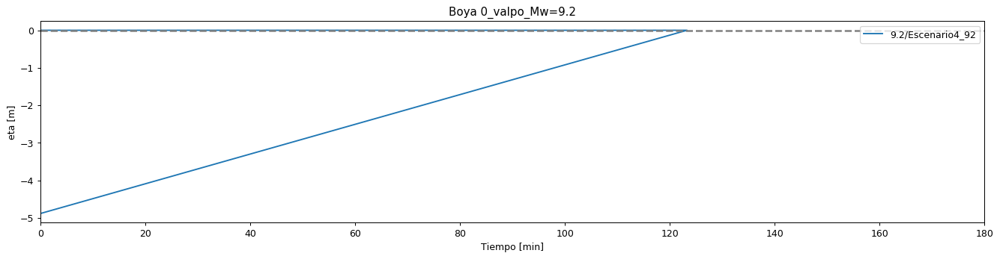

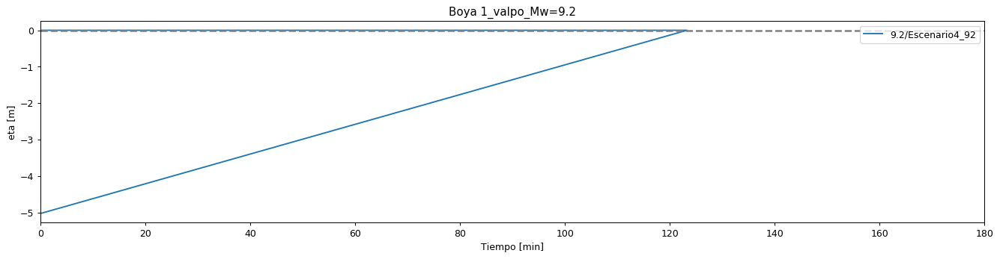

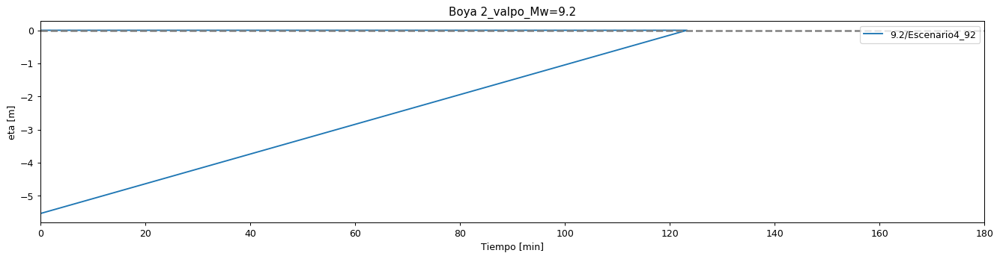

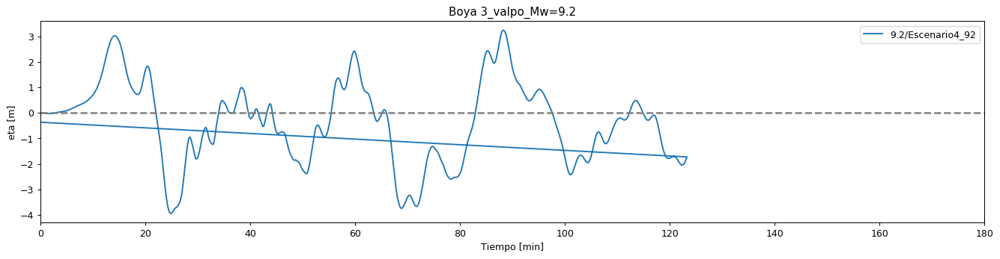

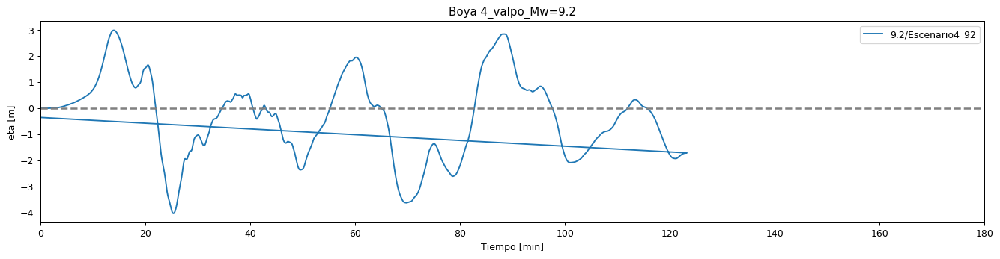

...

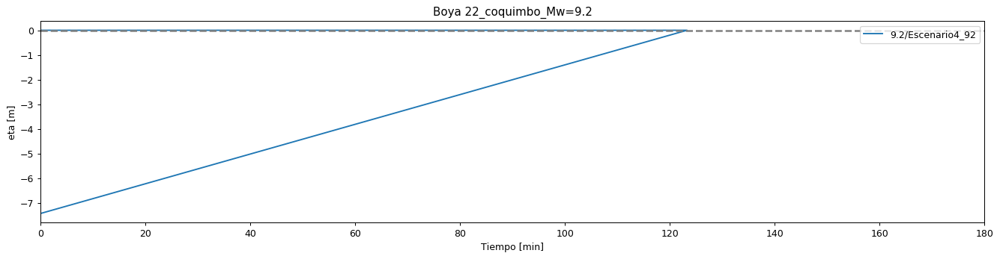

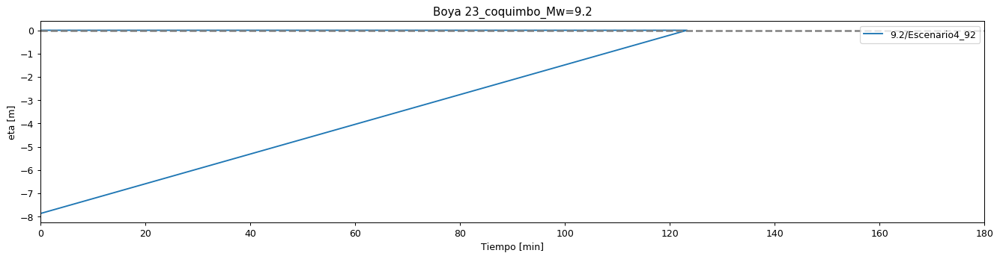

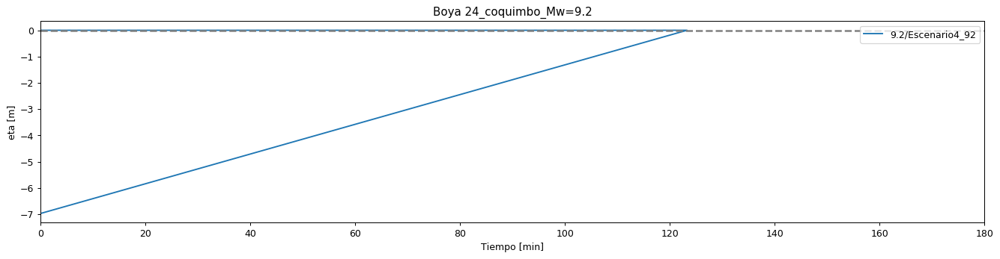

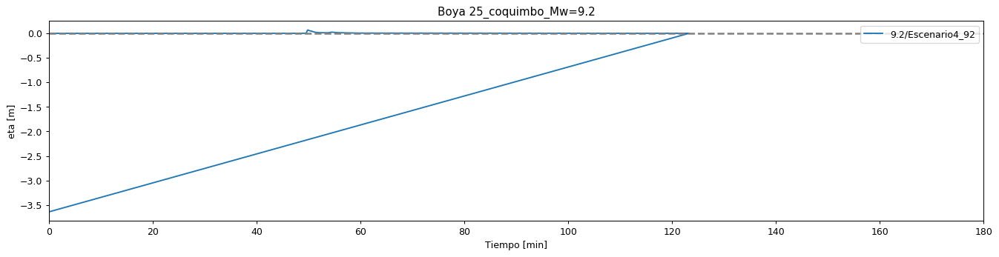

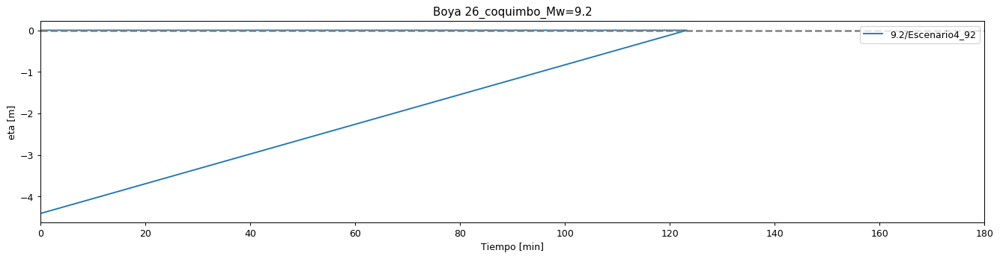

In [3]:
#eta
start_time = time.time()
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure(figsize=(14,6), dpi=90)
    plt.axes([0, 0, 1, 0.5])
    
    for j in runs:
        if j==runs[0]:
            ratio='|ratio: [2 8 8] res:7 mts, tpo: 21h 41min'  #cambiar ratios y resolución según escenarios
        elif j==runs[1]:
            ratio='|ratio: [2 8 8] res:7 mts, tpo: 21h 41min'
        elif j==runs[2]:
            ratio='|ratio: [2 4 8] res:14 mts, tpo: 1h 40min'
        else:
            ratio='|ratio: [2 2 8] res:28 mts, tpo: 30min'
        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        times = base.variables['time'][:].data
        time_i = np.zeros(times.shape[0])
        for k in range(0,times.shape[0]):
            texto2 = str(times[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
        plt.plot(time_i, eta[:,i]-eta[:,i][0], label=j.split('=')[1].split('/layer01')[0])    
        #plt.plot(time_i, eta[:,i], label=j.split('=')[1].split('/layer01')[0]+ratio)
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-8,8))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('eta [m]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_eta+'/'+'Valpo_eta_Boya_'+str(i)+'_' +Escenario.split('-')[0]+ '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('-')[0])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('eta [m]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+carpeta+Escenario+fold_eta+'/'+'Coquimbo_eta_Boya_'+str(i-(lim_boya_valpo+1))+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
        
print("--- %s seconds ---" % (time.time() - start_time))

/usr/lib/python2.7/dist-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


--- 85.7283060551 seconds ---


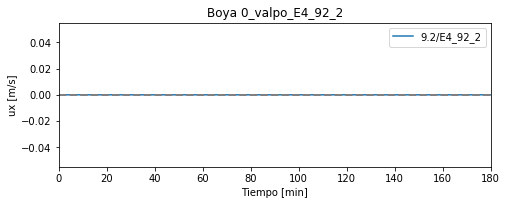

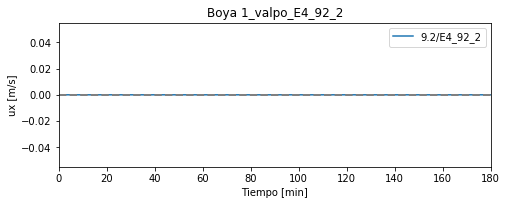

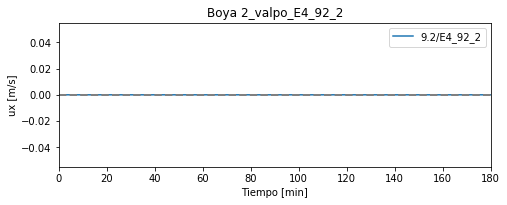

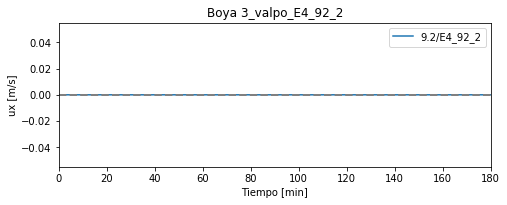

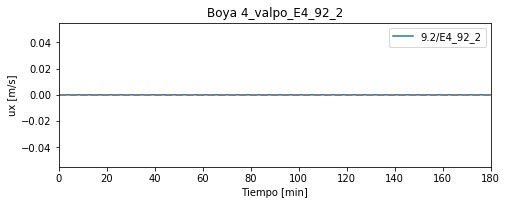

...

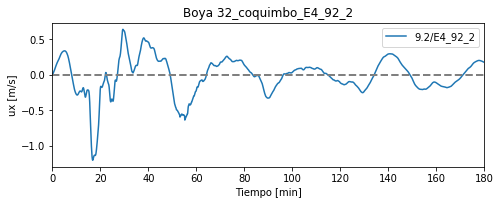

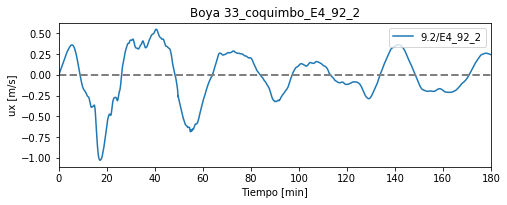

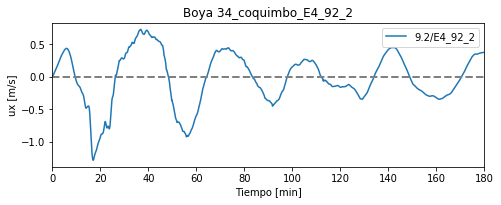

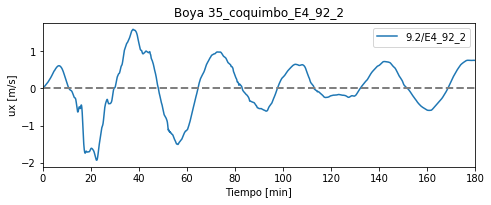

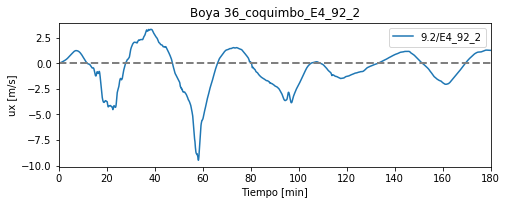

In [54]:
#ux
start_time = time.time()
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure()
    plt.axes([0, 0, 1, 0.5])
    for j in runs:

        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['ux'][:].data
        times = base.variables['time'][:].data
        time_i = np.zeros(times.shape[0])
        for k in range(0,times.shape[0]):
            texto2 = str(times[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
        plt.plot(time_i, eta[:,i], label=j.split('=')[1].split('/layer01')[0])
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-5,5))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('/')[1])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('ux [m/s]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+Escenario+carpeta+fold_ux+'/'+'Valpo_ux_Boya_'+str(i)+'_' +Escenario.split('/')[1]+ '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('/')[1])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('ux [m/s]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+Escenario+carpeta+fold_ux+'/'+'Coquimbo_ux_Boya_'+str(i-(lim_boya_valpo+1))+'_' +Escenario.split('/')[1]+ '.png', bbox_inches='tight', dpi=600)
print("--- %s seconds ---" % (time.time() - start_time))   

--- 82.2897381783 seconds ---


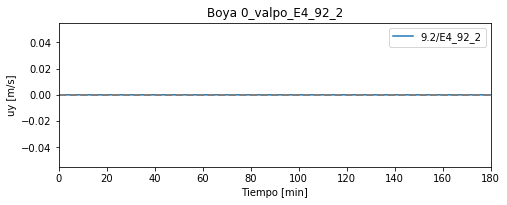

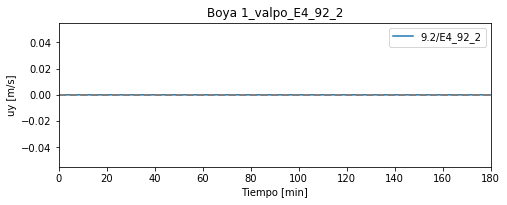

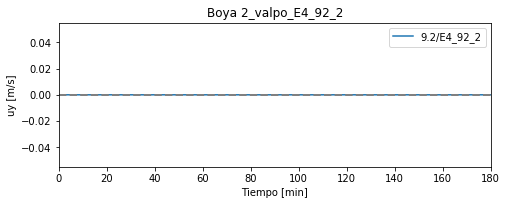

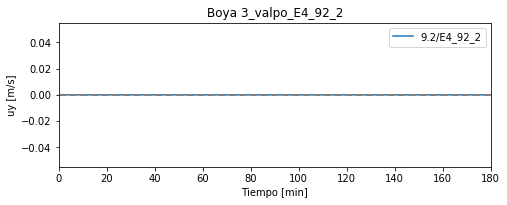

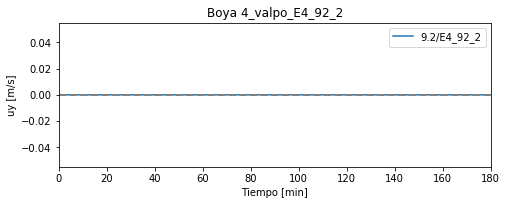

...

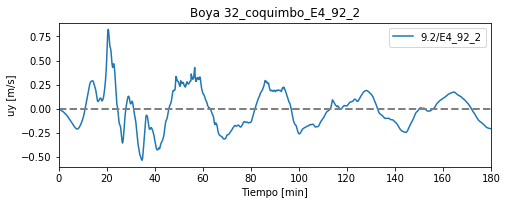

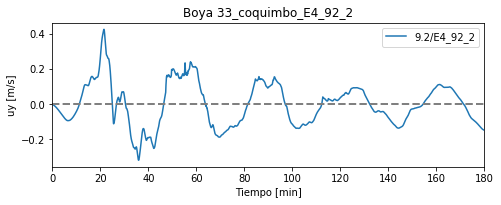

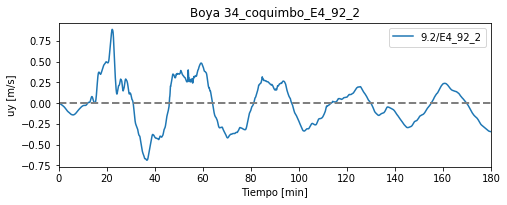

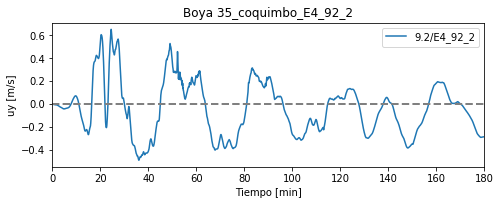

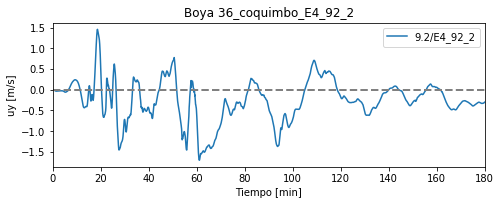

In [55]:
#uy
start_time = time.time()
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure()
    plt.axes([0, 0, 1, 0.5])
    for j in runs:

        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['uy'][:].data
        times = base.variables['time'][:].data
        time_i = np.zeros(times.shape[0])
        for k in range(0,times.shape[0]):
            texto2 = str(times[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
        plt.plot(time_i, eta[:,i], label=j.split('=')[1].split('/layer01')[0])
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-4,3))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('/')[1])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('uy [m/s]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+Escenario+carpeta+fold_uy+'/'+'Valpo_uy_Boya_'+str(i)+'_' +Escenario.split('/')[1]+ '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('/')[1])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('uy [m/s]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+Escenario+carpeta+fold_uy+'/'+'Coquimbo_uy_Boya_'+str(i-(lim_boya_valpo+1))+'_' +Escenario.split('/')[1]+ '.png', bbox_inches='tight', dpi=600)
        
print("--- %s seconds ---" % (time.time() - start_time)) 

--- 82.2093391418 seconds ---


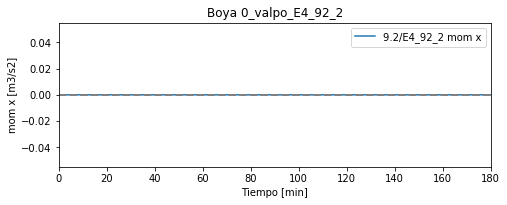

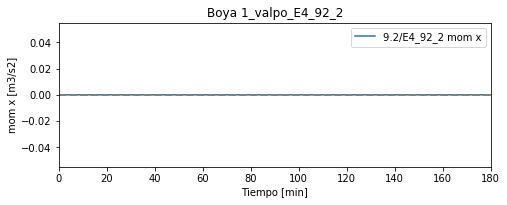

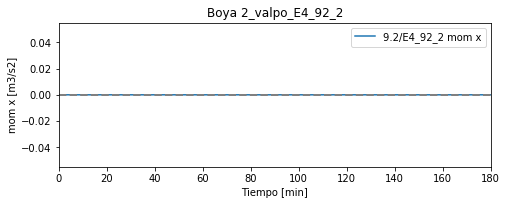

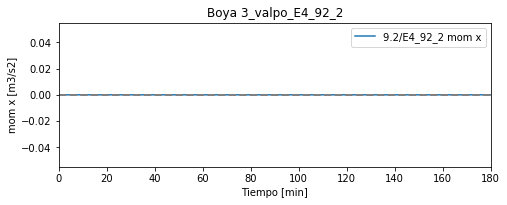

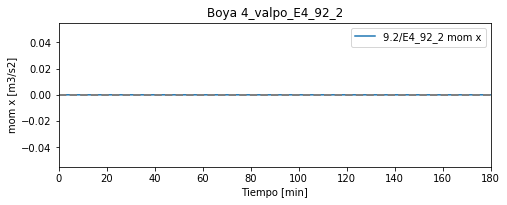

...

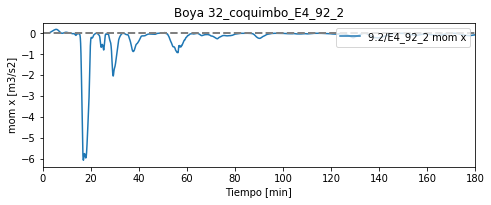

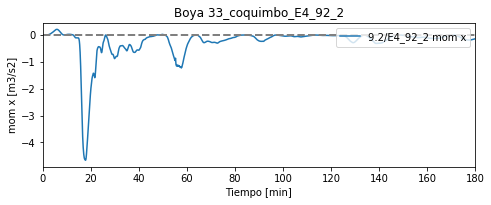

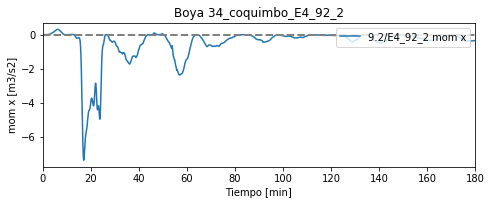

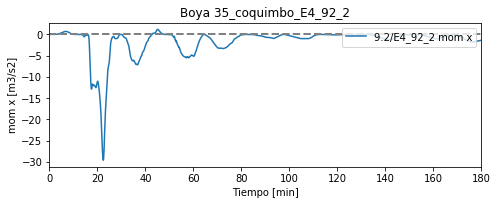

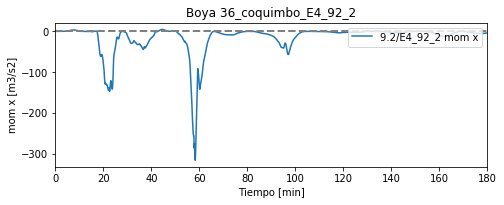

In [56]:
#mom_x
start_time = time.time()
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure()
    plt.axes([0, 0, 1, 0.5])
    for j in runs:

        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        ux = base.variables['ux'][:].data
        uy = base.variables['uy'][:].data
        times = base.variables['time'][:].data
        time_i = np.zeros(times.shape[0])
        for k in range(0,times.shape[0]):
            texto2 = str(times[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
        plt.plot(time_i, (eta[:,i]-eta[:,i][0])*ux[:,i]*ux[:,i], label=j.split('=')[1].split('/layer01')[0]+' mom x')
        #plt.plot(time_i, (eta[:,i]-eta[:,i][0])*uy[:,i]*uy[:,i],'--', label=j.split('=')[1].split('/layer01')[0]+'mom y')
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-7,10))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('/')[1])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('mom x [m3/s2]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+Escenario+carpeta+fold_mom_x+'/'+'Valpo_mom_x_Boya_'+str(i)+'_' +Escenario.split('/')[1]+ '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('/')[1])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('mom x [m3/s2]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+Escenario+carpeta+fold_mom_x+'/'+'Coquimbo_mom_x_Boya_'+str(i-(lim_boya_valpo+1))+'_'+Escenario.split('/')[1] + '.png', bbox_inches='tight', dpi=600)
        
print("--- %s seconds ---" % (time.time() - start_time)) 

--- 83.4335389137 seconds ---


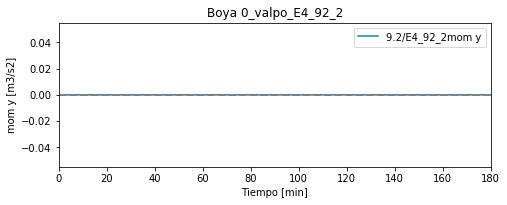

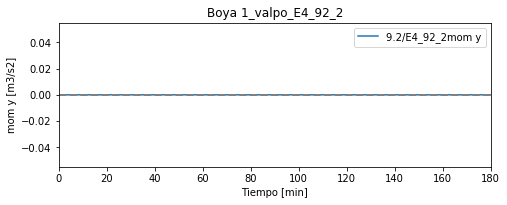

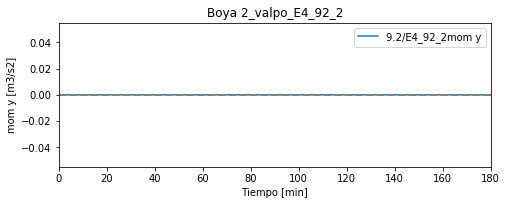

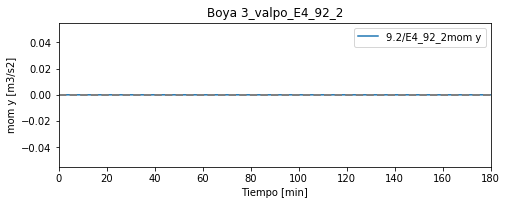

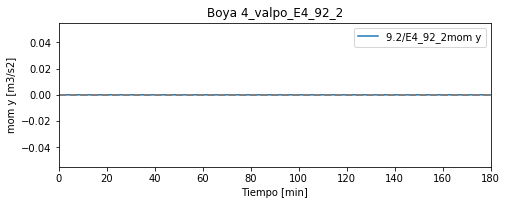

...

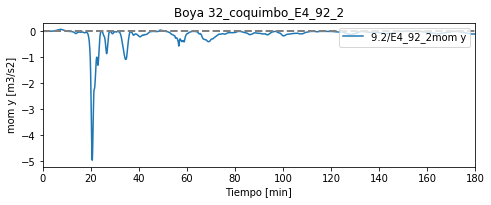

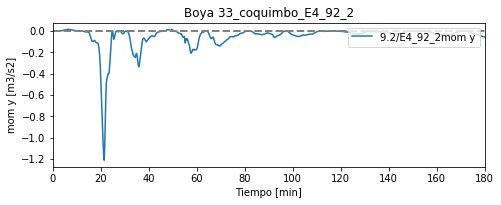

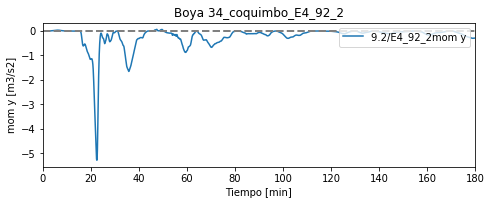

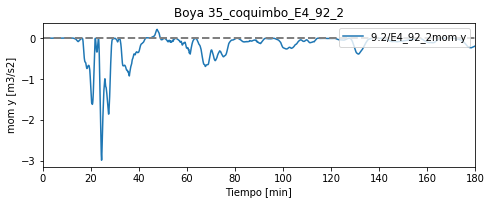

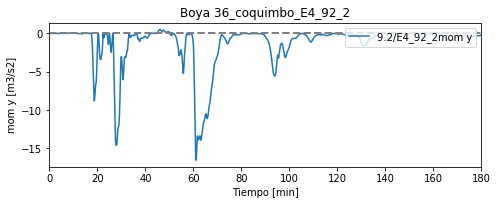

In [58]:
#mom_y
start_time = time.time()
x = np.linspace(0, 180, 100)
y = np.zeros(100)
for i in boyas:
    plt.figure()
    plt.axes([0, 0, 1, 0.5])
    for j in runs:

        base = xr.open_dataset(j+'.nc')
        eta  = base.variables['eta'][:].data
        ux = base.variables['ux'][:].data
        uy = base.variables['uy'][:].data
        times = base.variables['time'][:].data
        time_i = np.zeros(times.shape[0])
        for k in range(0,times.shape[0]):
            texto2 = str(times[k]).split(':')
            texto1 = texto2[0].split('T')
            seg = float(texto2[2])
            mnt = float(texto2[1])
            hrs = float(texto1[1])
            time_i[k]=hrs*60+mnt+seg/60  
            
        #plt.plot(time_i, (eta[:,i]-eta[:,i][0])*ux[:,i]*ux[:,i], label=j.split('=')[1].split('/layer01')[0]+'mom x')
        plt.plot(time_i, (eta[:,i]-eta[:,i][0])*uy[:,i]*uy[:,i], label=j.split('=')[1].split('/layer01')[0]+'mom y')
    #plt.scatter(t, h, color='purple',s=1)
    
    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
    plt.xlim((0,180))
    #plt.ylim((-3,3))
    if i<=lim_boya_valpo:
        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('/')[1])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('mom y [m3/s2]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+Escenario+carpeta+fold_mom_y+'/'+'Valpo_mom_y_Boya_'+str(i)+'_'+Escenario.split('/')[1] + '.png', bbox_inches='tight', dpi=600)
    else:
        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('/')[1])
        plt.xlabel('Tiempo [min]')
        plt.ylabel('mom y [m3/s2]')
        plt.legend(loc='upper right')
        plt.savefig(ruta+Escenario+carpeta+fold_mom_y+'/'+'Coquimbo_mom_y_Boya_'+str(i-(lim_boya_valpo+1))+'_'+Escenario.split('/')[1] + '.png', bbox_inches='tight', dpi=600)
        
print("--- %s seconds ---" % (time.time() - start_time)) 

--- 46.0016579628 seconds ---


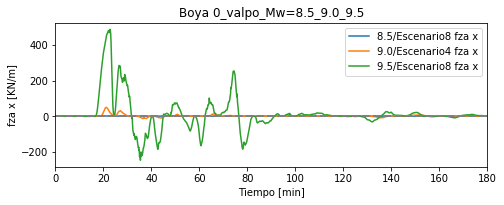

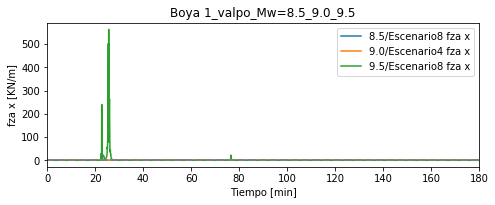

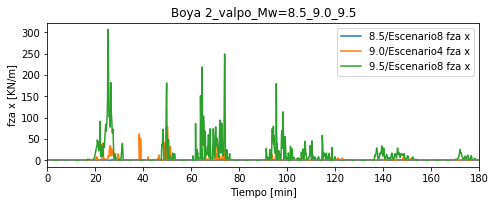

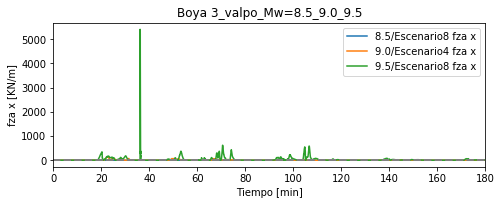

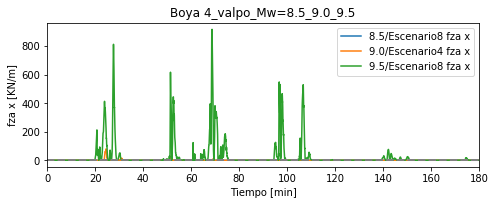

...

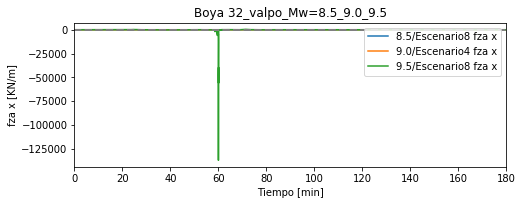

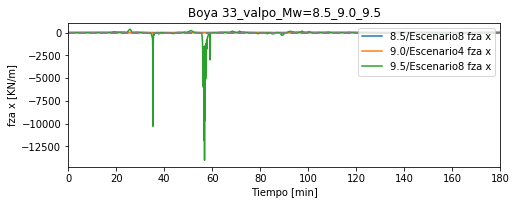

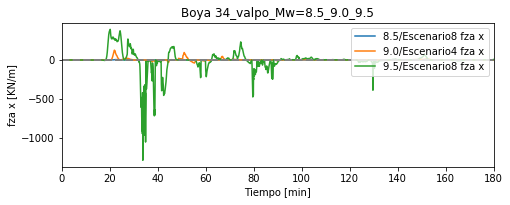

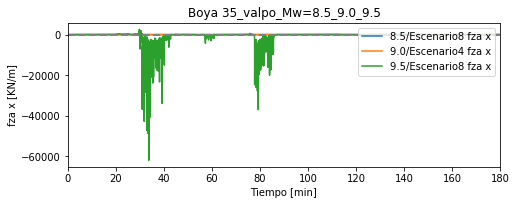

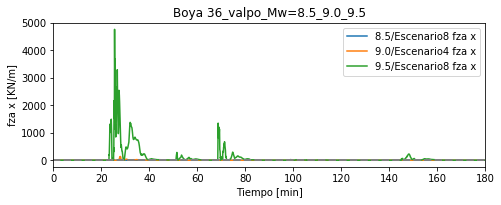

In [24]:
#fza_x/m
#start_time = time.time()
#x = np.linspace(0, 180, 100)
#y = np.zeros(100)
#for i in boyas:
#    plt.figure()
#    plt.axes([0, 0, 1, 0.5])
#    for j in runs:

#        base = xr.open_dataset(j+'.nc')
#        eta  = base.variables['eta'][:].data
#        ux = base.variables['ux'][:].data
#        uy = base.variables['uy'][:].data
#        times = base.variables['time'][:].data
#        time_i = np.zeros(times.shape[0])
#        for k in range(0,times.shape[0]):
#            texto2 = str(times[k]).split(':')
#            texto1 = texto2[0].split('T')
#            seg = float(texto2[2])
#            mnt = float(texto2[1])
#            hrs = float(texto1[1])
#            time_i[k]=hrs*60+mnt+seg/60  
            
#        plt.plot(time_i, 1.2*(eta[:,i]-eta[:,i][0])*ux[:,i]*ux[:,i], label=j.split('=')[1].split('/layer01')[0]+' fza x')
        #plt.plot(time_i, (eta[:,i]-eta[:,i][0])*uy[:,i]*uy[:,i],'--', label=j.split('=')[1].split('/layer01')[0]+'mom y')
    #plt.scatter(t, h, color='purple',s=1)
    
#    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
#    plt.xlim((0,180))
    #plt.ylim((-7,10))
#    if i<=lim_boya_valpo:
#        plt.title('Boya '+str(i)+'_valpo_'+Escenario.split('-')[0])
#        plt.xlabel('Tiempo [min]')
#        plt.ylabel('fza x [KN/m]')
#        plt.legend(loc='upper right')
#        plt.savefig(ruta+carpeta+Escenario+fold_fza_x+'/'+'Valpo_fza_x_Boya_'+str(i)+'_' +Escenario.split('-')[0]+ '.png', bbox_inches='tight', dpi=600)
#    else:
#        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_'+Escenario.split('-')[0])
#        plt.xlabel('Tiempo [min]')
#        plt.ylabel('fza x [KN/m]')
#        plt.legend(loc='upper right')
#        plt.savefig(ruta+carpeta+Escenario+fold_fza_x+'/'+'Coquimbo_fza_x_Boya_'+str(i-(lim_boya_valpo+1))+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
        
#print("--- %s seconds ---" % (time.time() - start_time)) 

--- 42.9030389786 seconds ---


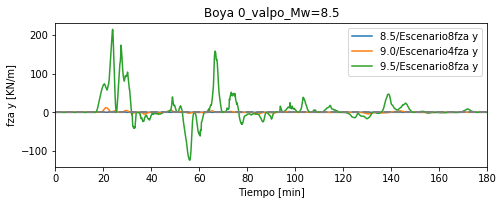

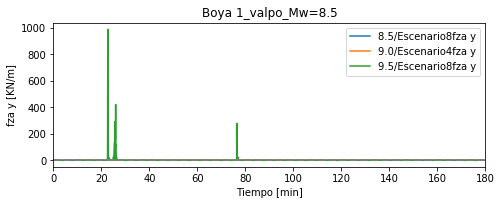

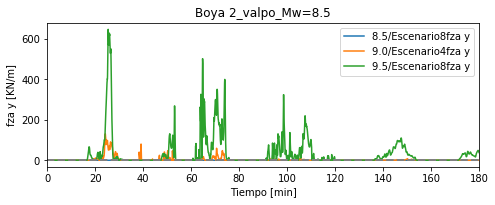

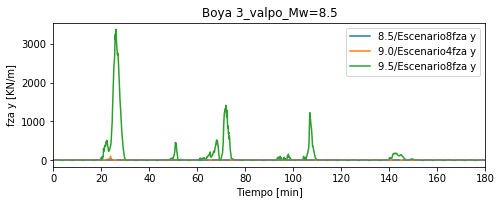

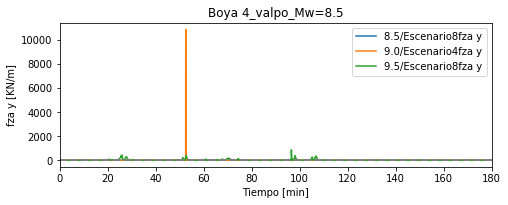

...

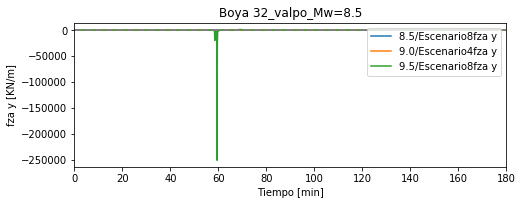

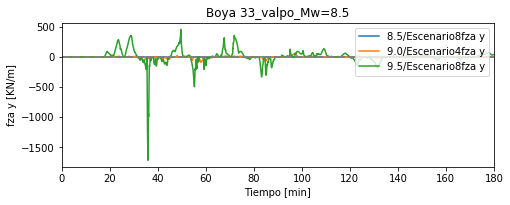

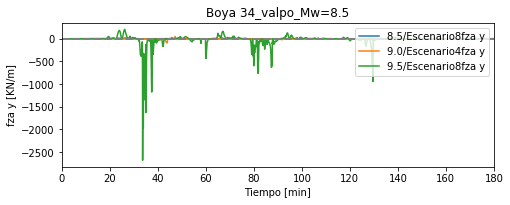

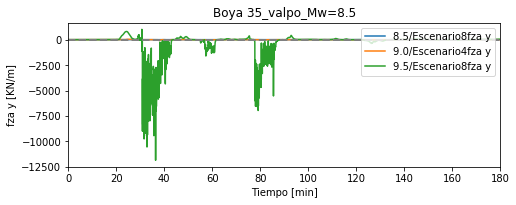

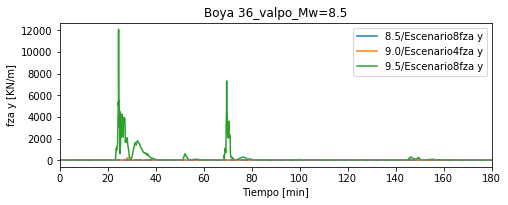

In [25]:
#fza_y/m
#start_time = time.time()
#x = np.linspace(0, 180, 100)
#y = np.zeros(100)
#for i in boyas:
#    plt.figure()
#    plt.axes([0, 0, 1, 0.5])
#    for j in runs:

#        base = xr.open_dataset(j+'.nc')
#        eta  = base.variables['eta'][:].data
#        ux = base.variables['ux'][:].data
#        uy = base.variables['uy'][:].data
#        times = base.variables['time'][:].data
#        time_i = np.zeros(times.shape[0])
#        for k in range(0,times.shape[0]):
#            texto2 = str(times[k]).split(':')
#            texto1 = texto2[0].split('T')
#            seg = float(texto2[2])
#            mnt = float(texto2[1])
#            hrs = float(texto1[1])
#            time_i[k]=hrs*60+mnt+seg/60  
            
        #plt.plot(time_i, (eta[:,i]-eta[:,i][0])*ux[:,i]*ux[:,i], label=j.split('=')[1].split('/layer01')[0]+'mom x')
#        plt.plot(time_i, 1.2*(eta[:,i]-eta[:,i][0])*uy[:,i]*uy[:,i], label=j.split('=')[1].split('/layer01')[0]+'fza y')
    #plt.scatter(t, h, color='purple',s=1)
    
#    plt.plot(x, y, color='grey',linewidth=2, linestyle='dashed')
#    plt.xlim((0,180))
    #plt.ylim((-3,3))
#    if i<=lim_boya_valpo:
#        plt.title('Boya '+str(i)+'_valpo_Mw=8.5')
#        plt.xlabel('Tiempo [min]')
#        plt.ylabel('fza y [KN/m]')
#        plt.legend(loc='upper right')
#        plt.savefig(ruta+carpeta+Escenario+fold_fza_y+'/'+'Valpo_fza_y_Boya_'+str(i)+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
#    else:
#        plt.title('Boya '+str(i-(lim_boya_valpo+1))+'_coquimbo_Mw=8.5')
#        plt.xlabel('Tiempo [min]')
#        plt.ylabel('fza y [KN/m]')
#        plt.legend(loc='upper right')
#        plt.savefig(ruta+carpeta+Escenario+fold_fza_y+'/'+'Coquimbo_fza_y_Boya_'+str(i-(lim_boya_valpo+1))+'_'+Escenario.split('-')[0] + '.png', bbox_inches='tight', dpi=600)
        
#print("--- %s seconds ---" % (time.time() - start_time)) 